In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import scib
import harmonypy
import pymn
import scrublet as scr
from matplotlib.pyplot import rc_context
import os

/mnt/hdd1/tools/anaconda3/lib/python3.9/site-packages/pyMetaNeighbor-0.1.0-py3.9.egg/pymn/trainModel.py:29: SyntaxWarning: "is not" with a literal. Did you mean "!="?
/mnt/hdd1/tools/anaconda3/lib/python3.9/site-packages/pyMetaNeighbor-0.1.0-py3.9.egg/pymn/trainModel.py:29: SyntaxWarning: "is not" with a literal. Did you mean "!="?


In [2]:
sc.set_figure_params(dpi=300, color_map = 'viridis_r' )
sc.settings.verbosity = 2

/mnt/hdd1/tools/anaconda3/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [3]:
'''
https://scanpy-tutorials.readthedocs.io/en/latest/plotting/core.html
'''

'\nhttps://scanpy-tutorials.readthedocs.io/en/latest/plotting/core.html\n'

In [4]:
os.mkdir('figures')

# Presets

In [5]:
sample = 'ICC_p2'
tag = 'gene'
pc_select = 40
res = 0.4
batch_column = 'sample'
tissue_column = 'sample_type'
cancer_type = 'LUAD/Lung'

# Loading DGE 

In [6]:
adata_lognormal_noMT = sc.read('each_batch/' + sample + '_' + tag + '_combined_lognormal_noMT.h5ad')
adata_lognormal_noMT.obs['sample_type'] = adata_lognormal_noMT.obs['sample'].str.split('_', expand = True)[2]
del adata_lognormal_noMT.uns['log1p']

# Harmony (Default)

In [7]:
'''
Default: Using normalized DGE as input, then scale and run RCA. 
         ("You can also run Harmony on a sparse matrix of library size normalized expression counts. 
         Harmony will scale these counts, run PCA, and finally perform integration."
         Ref: https://github.com/immunogenomics/harmony)
'''

adata = adata_lognormal_noMT.copy()

sc.pp.scale(adata)

sc.tl.pca(adata, svd_solver = 'arpack')
sc.external.pp.harmony_integrate(adata, batch_column, basis = 'X_pca', adjusted_basis = 'X_pca_harmony', 
                                max_iter_harmony = 40)
del adata.obsm['X_pca']
adata.obsm['X_pca'] = adata.obsm['X_pca_harmony']

sc.pp.neighbors(adata, n_neighbors = 10, n_pcs = pc_select)
sc.tl.leiden(adata, resolution = res)
sc.tl.tsne(adata)
sc.tl.umap(adata)

computing PCA
    with n_comps=50
    finished (0:00:28)


2022-09-21 21:09:23,320 - harmonypy - INFO - Iteration 1 of 40
2022-09-21 21:09:30,769 - harmonypy - INFO - Iteration 2 of 40
2022-09-21 21:09:38,337 - harmonypy - INFO - Iteration 3 of 40
2022-09-21 21:09:45,456 - harmonypy - INFO - Iteration 4 of 40
2022-09-21 21:09:52,178 - harmonypy - INFO - Iteration 5 of 40
2022-09-21 21:09:57,423 - harmonypy - INFO - Iteration 6 of 40
2022-09-21 21:09:59,687 - harmonypy - INFO - Converged after 6 iterations


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished (0:00:27)
running Leiden clustering
    finished (0:00:05)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished (0:01:02)
computing UMAP
    finished (0:00:11)


In [8]:
sc.tl.rank_genes_groups(adata, 'leiden', method = 'wilcoxon')

ranking genes
    finished (0:00:39)


/mnt/hdd1/tools/anaconda3/lib/python3.9/site-packages/statsmodels/compat/pandas.py:12: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  version = LooseVersion(pd.__version__)
/mnt/hdd1/tools/anaconda3/lib/python3.9/site-packages/statsmodels/compat/pandas.py:14: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  pandas_lt_1_0_0 = version < LooseVersion('1.0.0')
/mnt/hdd1/tools/anaconda3/lib/python3.9/site-packages/statsmodels/compat/pandas.py:15: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  pandas_lt_25_0 = version < LooseVersion('0.25.0')
/mnt/hdd1/tools/anaconda3/lib/python3.9/site-packages/statsmodels/compat/pandas.py:16: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  pandas_gte_23_0 = version >= LooseVersion('0.23.0')
/mnt/hdd1/tools/anaconda3/lib/python3.9/site-packages/scanpy/tools/_rank_genes_gr

In [9]:
adata.write(sample + '_' + tag + '_harmony_default.h5ad')

In [10]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(200).to_csv(sample + '_' + tag + '_marker.csv')

pd.DataFrame(adata.obs['leiden']).to_csv(sample + '_' + tag + '_leiden.csv')

tissue_leiden = pd.DataFrame(adata.obs[['leiden', tissue_column]])

for each_type in np.unique(adata.obs[tissue_column]).tolist():
    tissue_leiden_subset = tissue_leiden[tissue_leiden[tissue_column] == each_type]
    del tissue_leiden_subset[tissue_column]
    tissue_leiden_subset.to_csv(sample + '_' + tag + '_' + each_type + '_leiden.csv')

# PCA & UMAP & tSNE

In [11]:
adata_lognormal_noMT = sc.read('each_batch/' + sample + '_' + tag + '_combined_lognormal_noMT.h5ad')
adata_lognormal_noMT.obs['sample_type'] = adata_lognormal_noMT.obs['sample'].str.split('_', expand = True)[2]

In [12]:
adata = sc.read(sample + '_' + tag + '_harmony_default.h5ad')

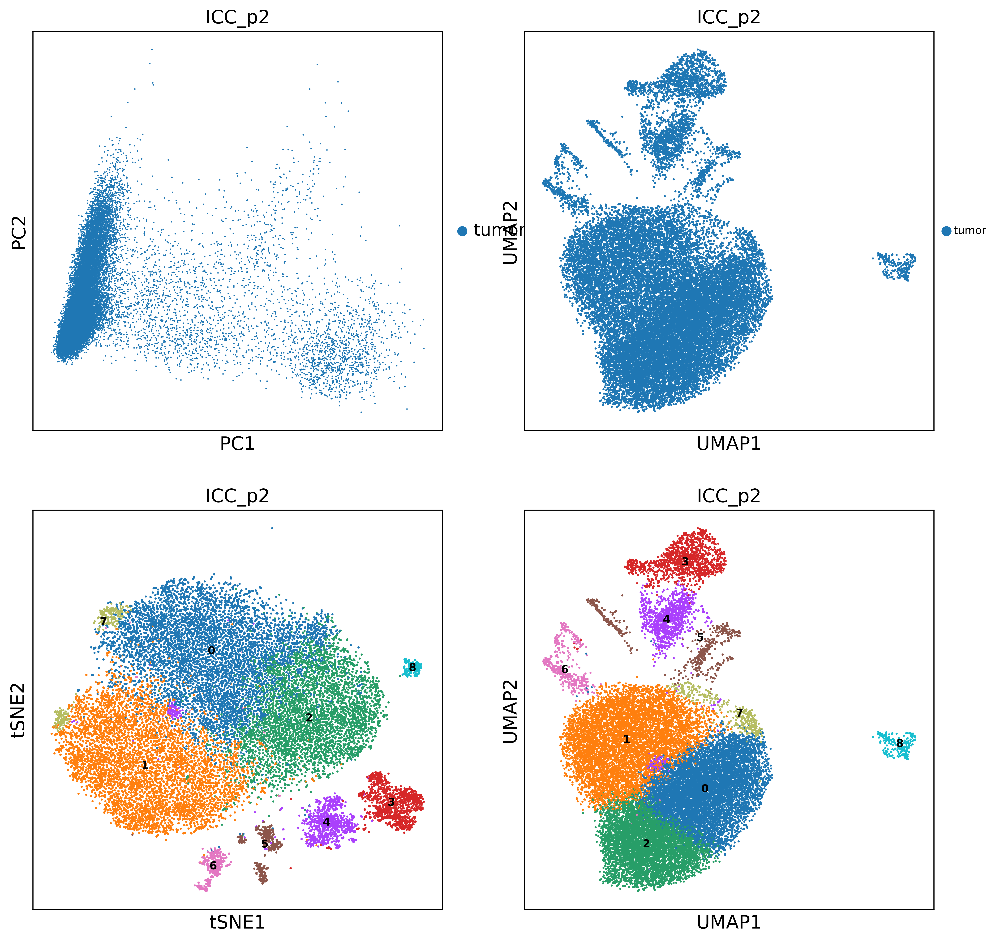

In [13]:
fig, axs = plt.subplots(2, 2, figsize = (12,12), dpi = 300)
sc.pl.pca(adata, color = tissue_column, title = sample, ax = axs[0,0], show = False)
sc.pl.umap(adata, color = tissue_column, size = 10, legend_fontsize = 'xx-small', title = sample, ax = axs[0,1], 
           show = False)
sc.pl.tsne(adata, color = 'leiden', size = 10, legend_fontsize = 'xx-small', legend_loc = 'on data', 
           title = sample, ax=axs[1,0], show=False)
sc.pl.umap(adata, color = 'leiden', size = 10, legend_fontsize = 'xx-small', legend_loc = 'on data', 
           title = sample, ax=axs[1,1], show=False)
plt.savefig('figures/pca_umap_tsne.png')

# Cluster Marker

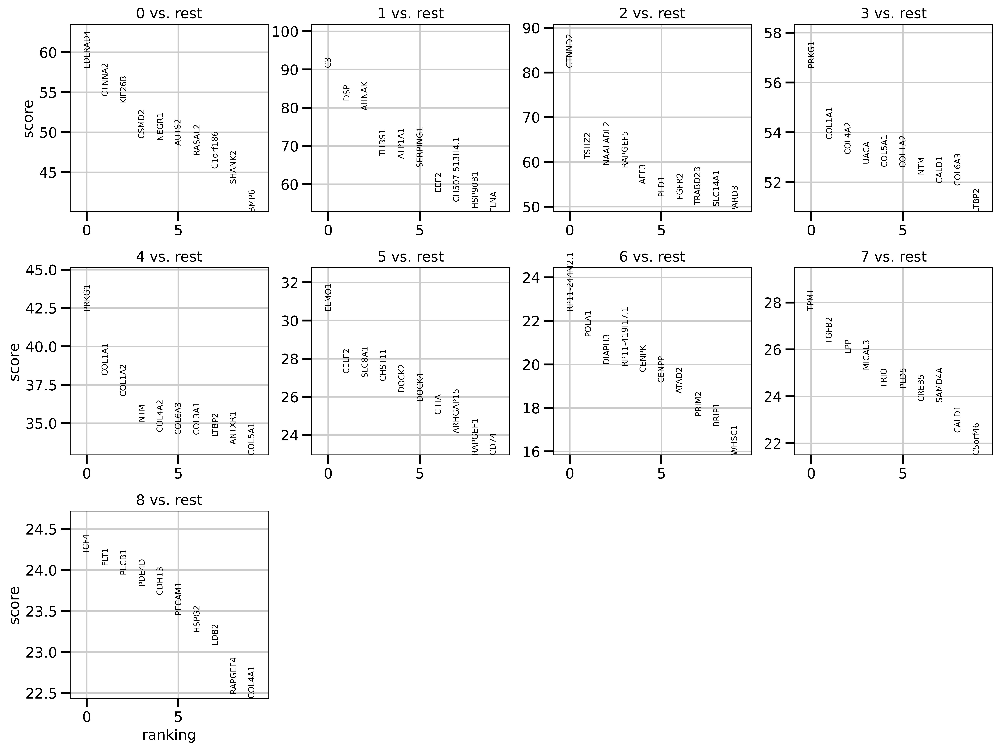

In [14]:
sc.pl.rank_genes_groups(adata, n_genes = 10, sharey = False, save = '_top10marker.png')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


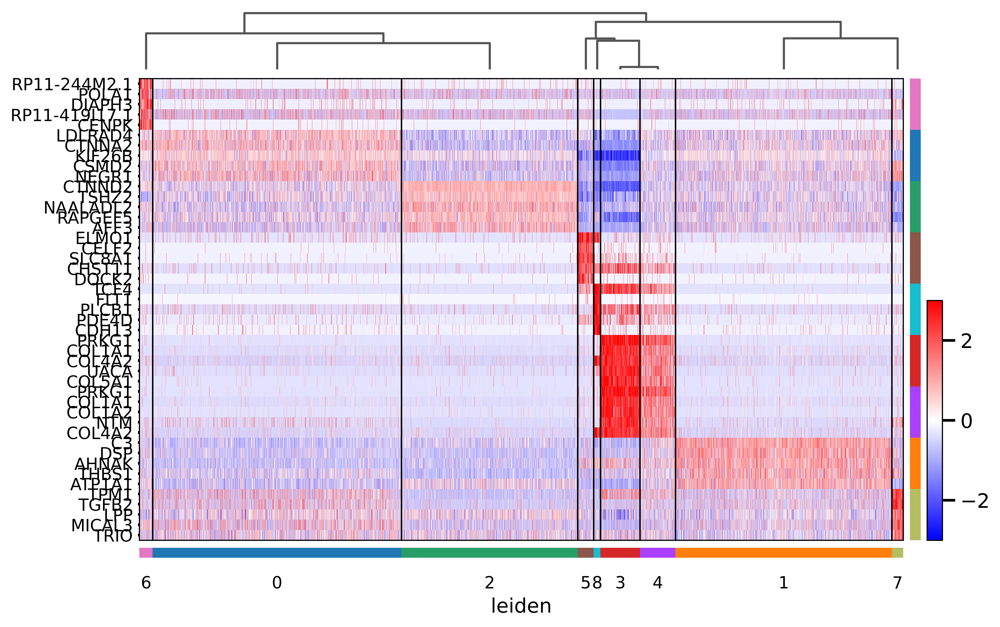

In [15]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes = 5, use_raw = False, swap_axes = True, vmin = -3, vmax = 3, 
                                    cmap = 'bwr', figsize = (10,7), save = '.png')

In [16]:
adata_raw = adata_lognormal_noMT.copy()

In [17]:
adata_raw.obs['leiden'] = adata.obs['leiden']

adata_raw.uns['leiden'] = adata.uns['leiden']
adata_raw.uns['leiden_colors'] = adata.uns['leiden_colors']
adata_raw.uns['neighbors'] = adata.uns['neighbors']
adata_raw.uns['pca'] = adata.uns['pca']
adata_raw.uns['rank_genes_groups'] = adata.uns['rank_genes_groups']
adata_raw.uns['tsne'] = adata.uns['tsne']
adata_raw.uns['umap'] = adata.uns['umap']

adata_raw.obsm['X_pca'] = adata.obsm['X_pca']
adata_raw.obsm['X_tsne'] = adata.obsm['X_tsne']
adata_raw.obsm['X_umap'] = adata.obsm['X_umap']

adata_raw.obsp['connectivities'] = adata.obsp['connectivities']
adata_raw.obsp['distances'] = adata.obsp['distances']

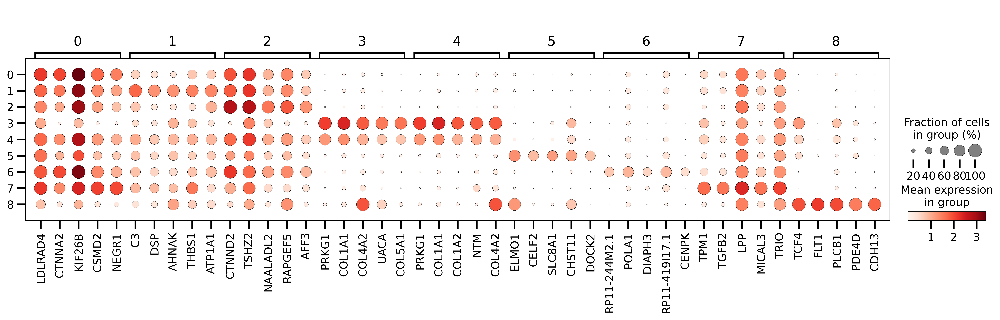

In [18]:
sc.pl.dotplot(adata_raw, pd.DataFrame(adata_raw.uns['rank_genes_groups']['names']).head(5).to_dict(orient = 'list'), 
              groupby = 'leiden', use_raw = False, save = 'top5marker.png')

# Canonical Marker

# Correlation

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


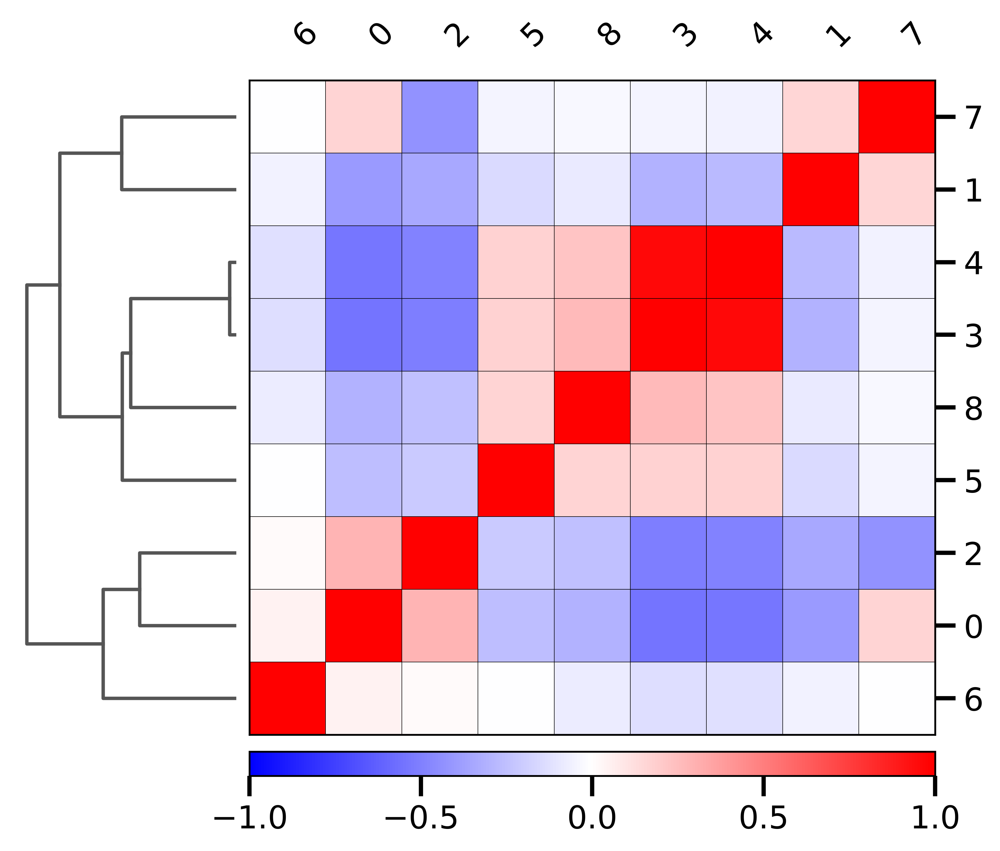

In [19]:
sc.pl.correlation_matrix(adata_raw, groupby = 'leiden', save = '.png')

# Sample Composition

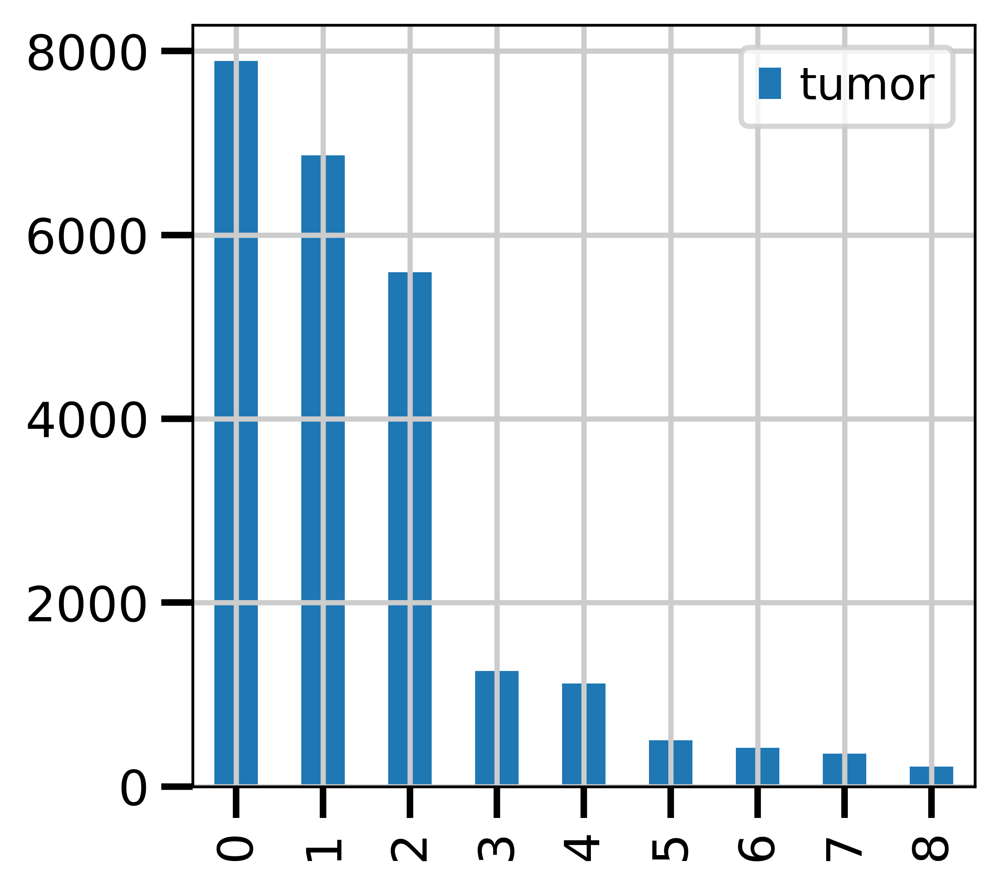

In [20]:
cluster_stat_all = pd.DataFrame()

for each_tissue in np.unique(adata.obs[tissue_column]).tolist():
    
    each_tissue_stat = pd.DataFrame(adata[adata.obs[tissue_column] == each_tissue].obs['leiden'].value_counts())
    each_tissue_stat.columns = [each_tissue]
    cluster_stat_all = pd.concat([each_tissue_stat, cluster_stat_all], axis = 1)
    
cluster_stat_all.plot(kind = 'bar', stacked = True)
plt.savefig('figures/sample_composition.png')